Alleyah Pauline C. Manalili

Chosen Dataset: https://archive.ics.uci.edu/dataset/544/estimation+of+obesity+levels+based+on+eating+habits+and+physical+condition

**TASK: Take 10 moderately sized subsamples and create a pairplot of the feature variable in relation to the target variable**

<Figure size 1200x800 with 0 Axes>

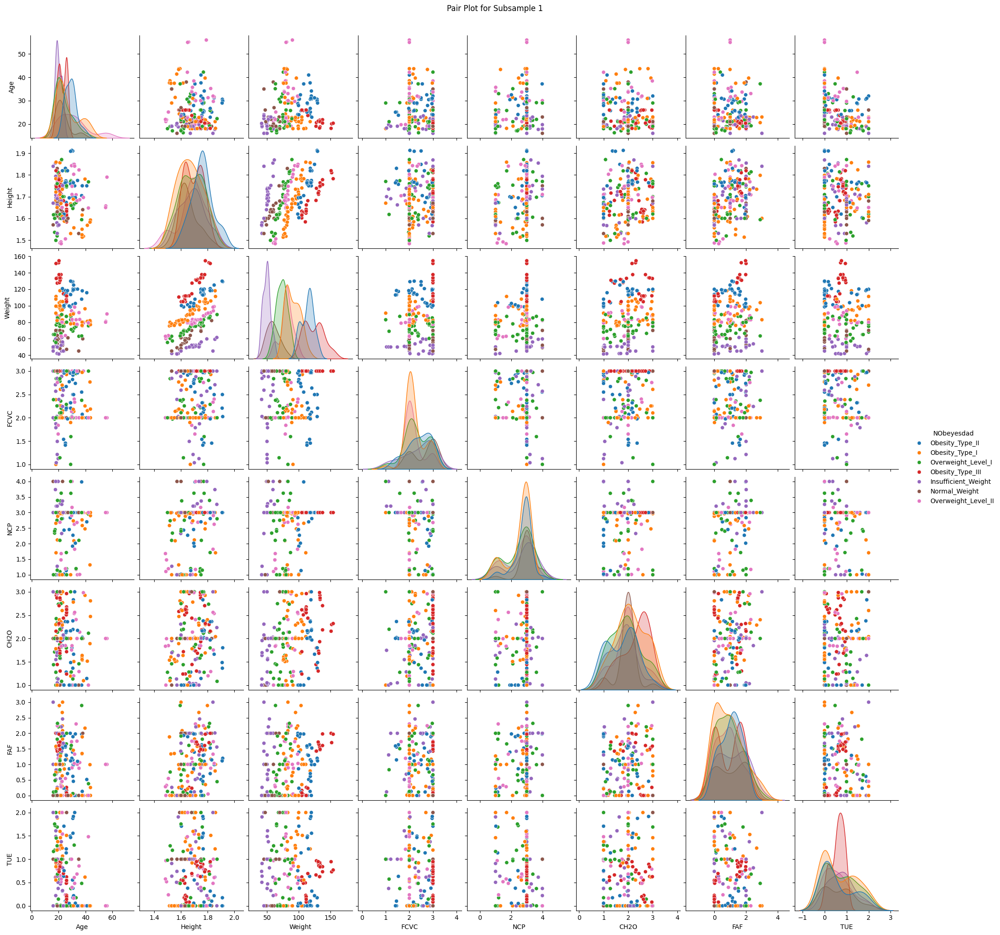

<Figure size 1200x800 with 0 Axes>

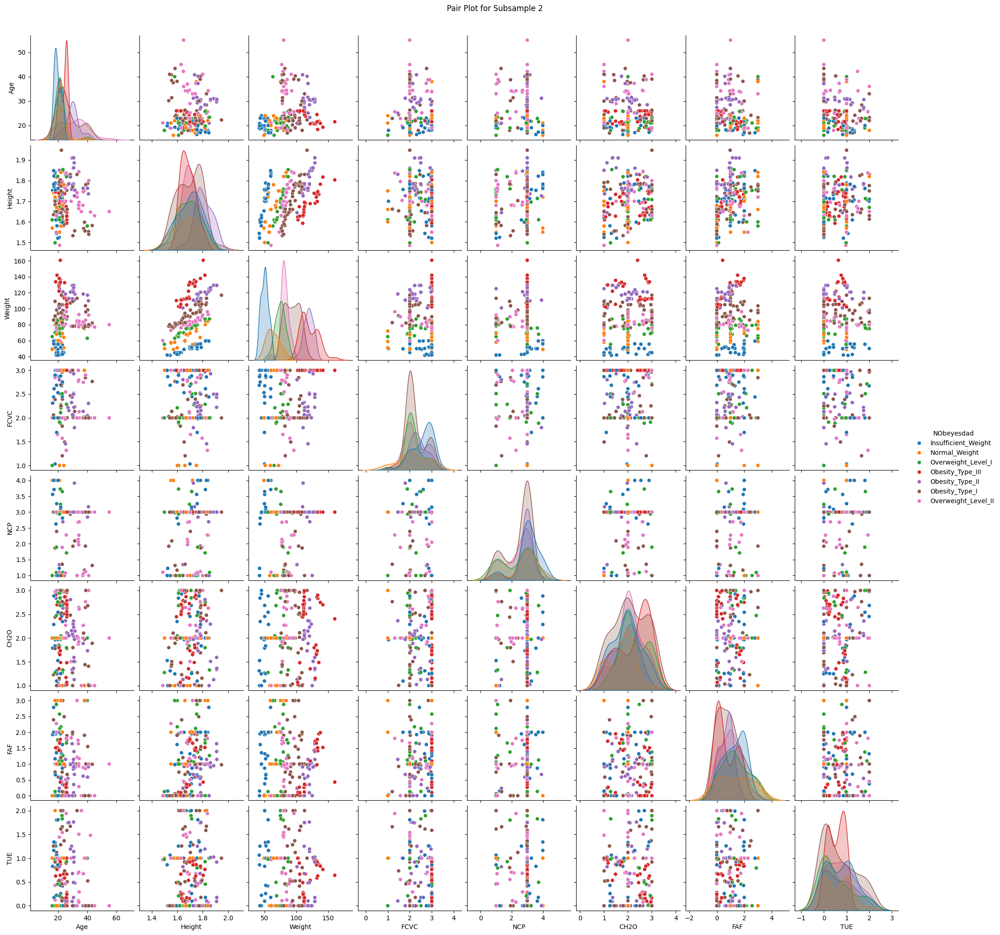

<Figure size 1200x800 with 0 Axes>

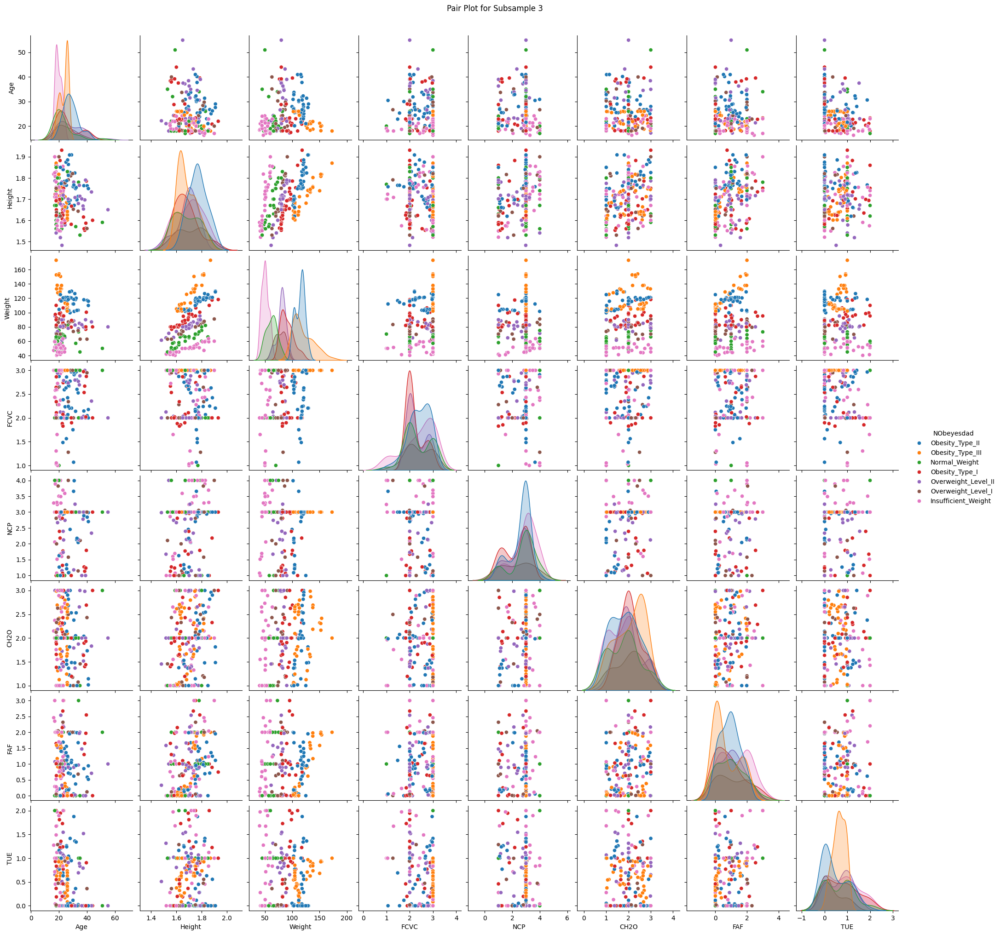

<Figure size 1200x800 with 0 Axes>

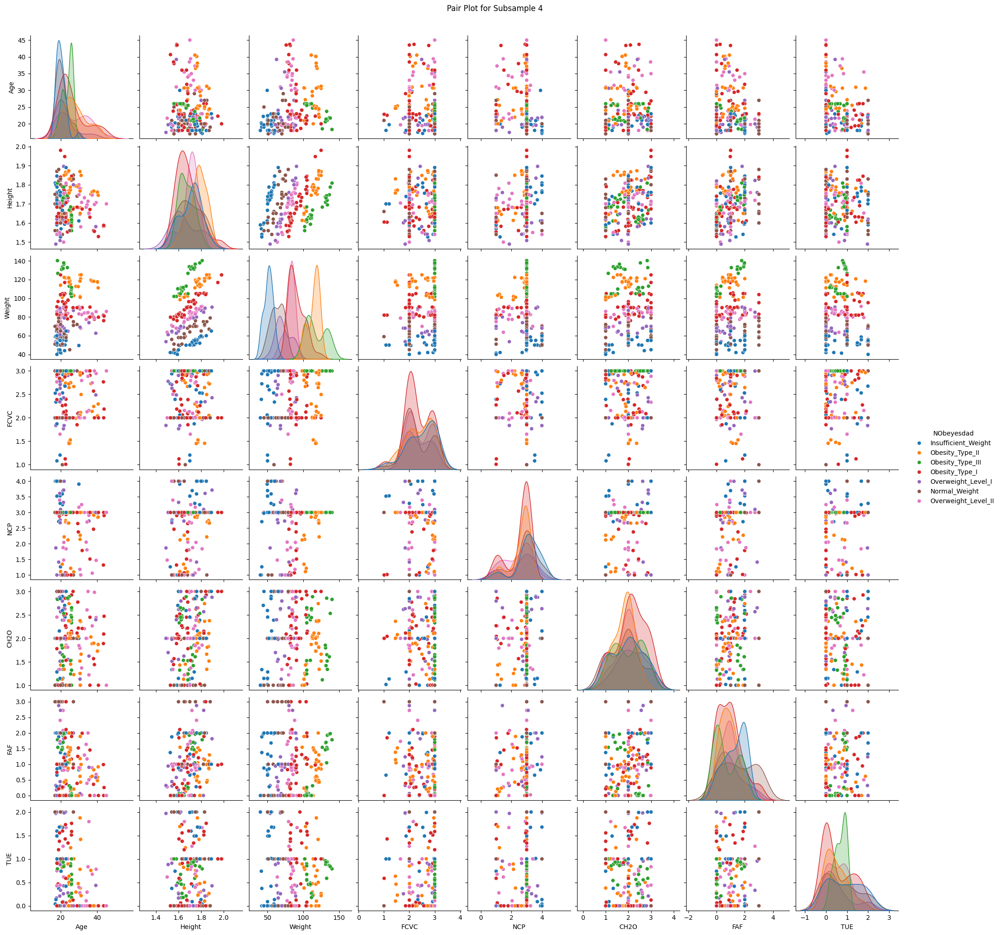

<Figure size 1200x800 with 0 Axes>

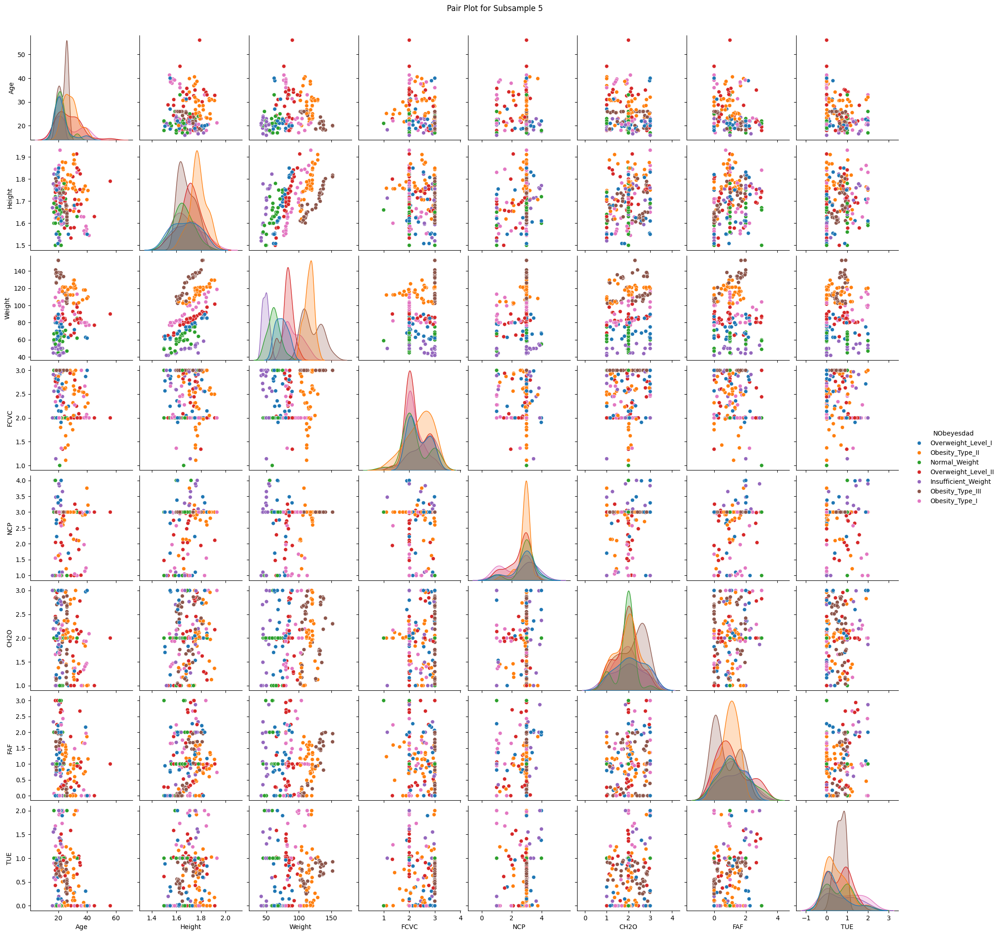

<Figure size 1200x800 with 0 Axes>

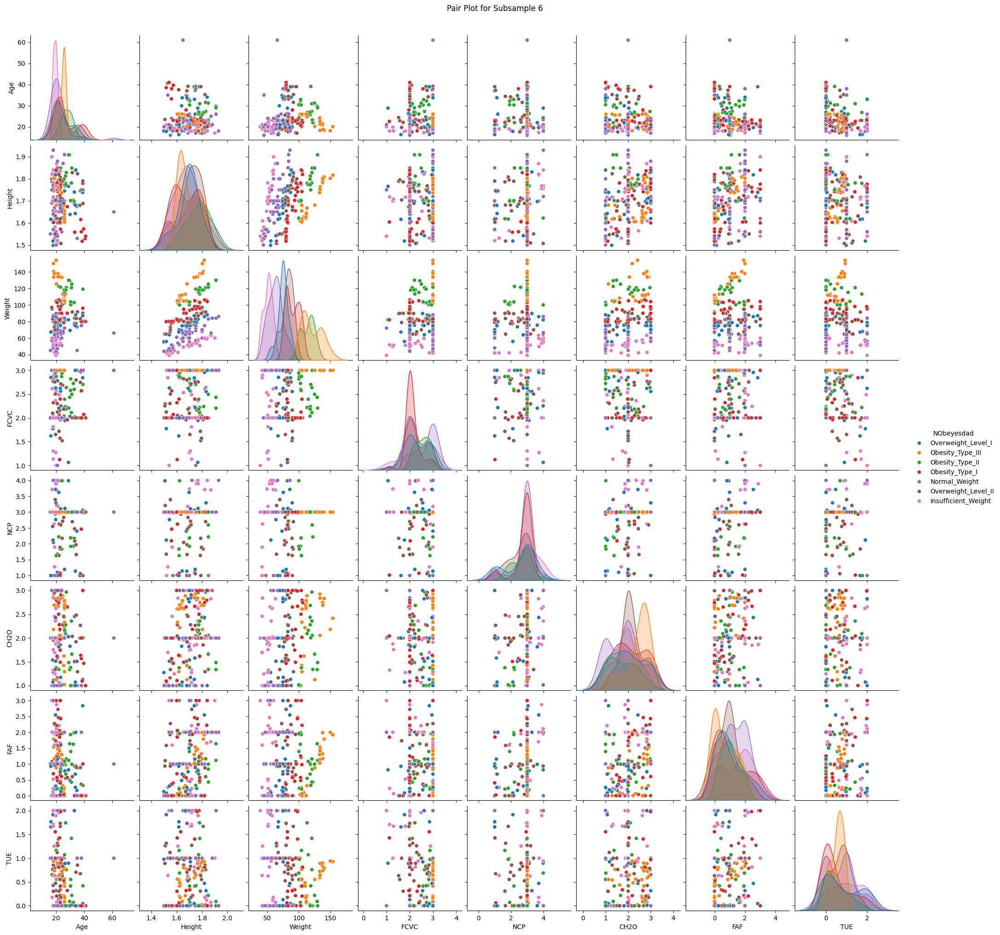

<Figure size 1200x800 with 0 Axes>

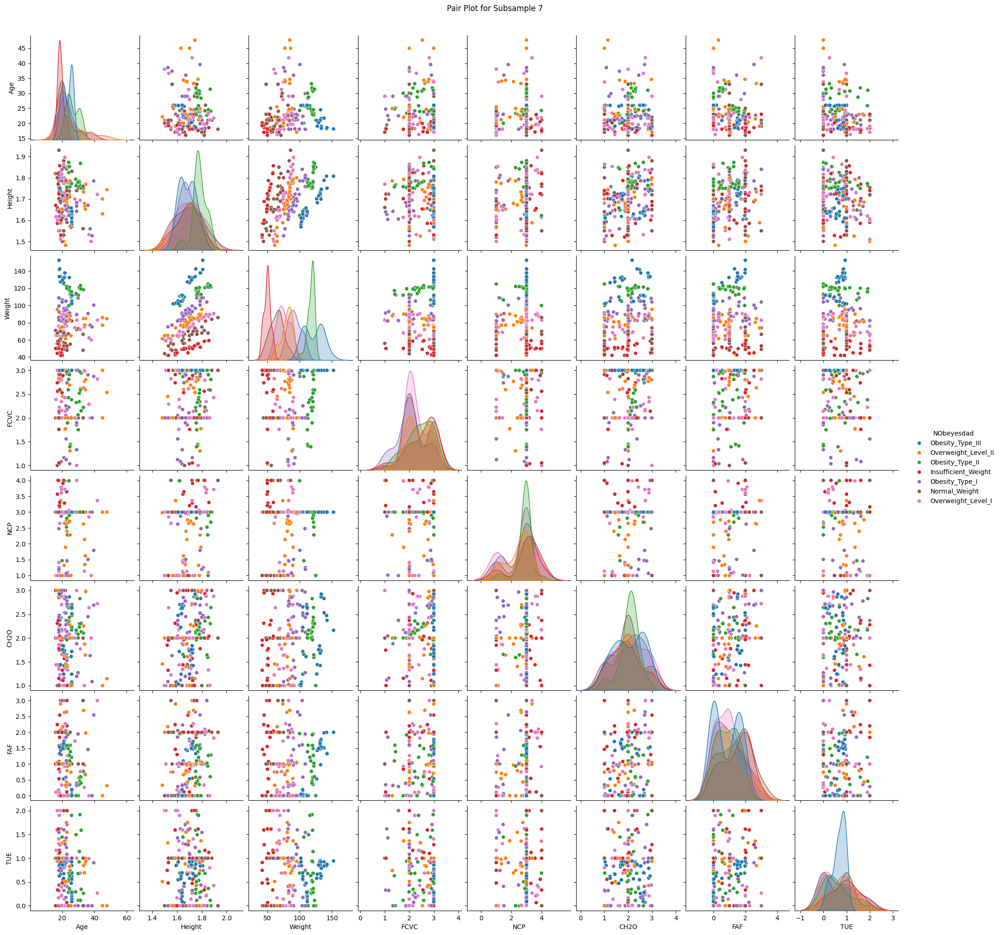

<Figure size 1200x800 with 0 Axes>

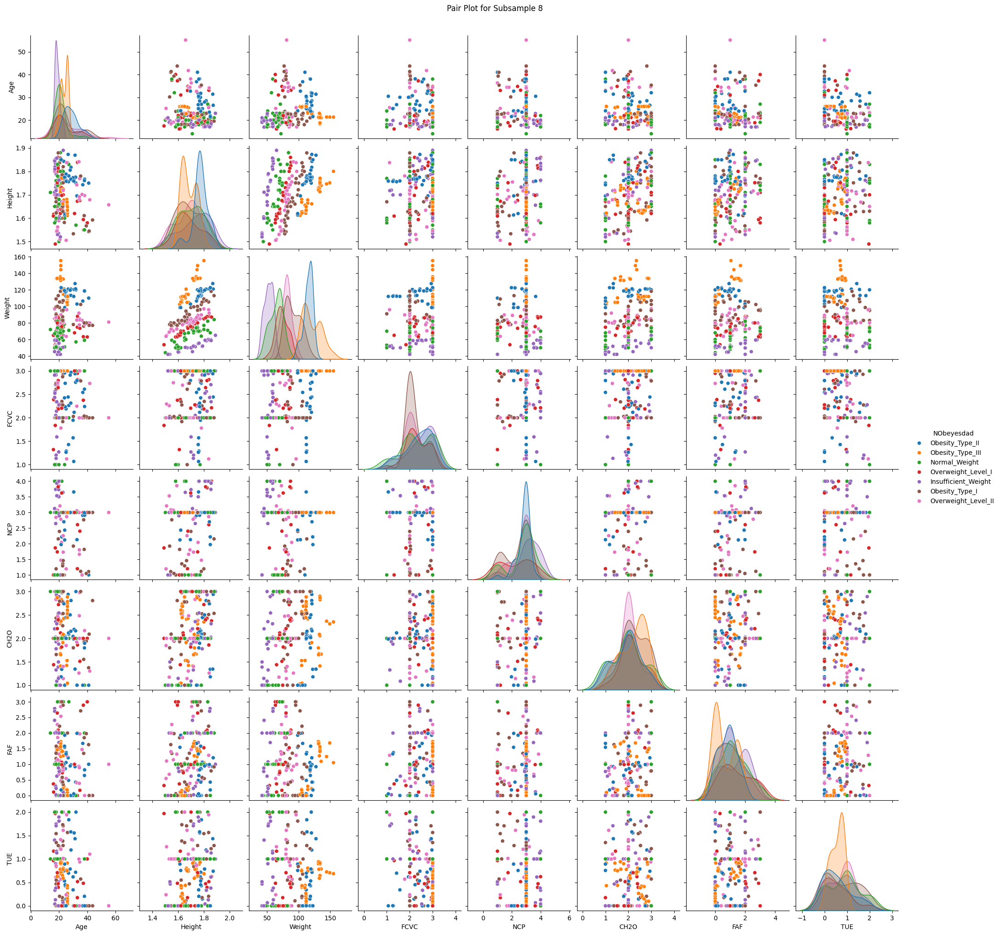

<Figure size 1200x800 with 0 Axes>

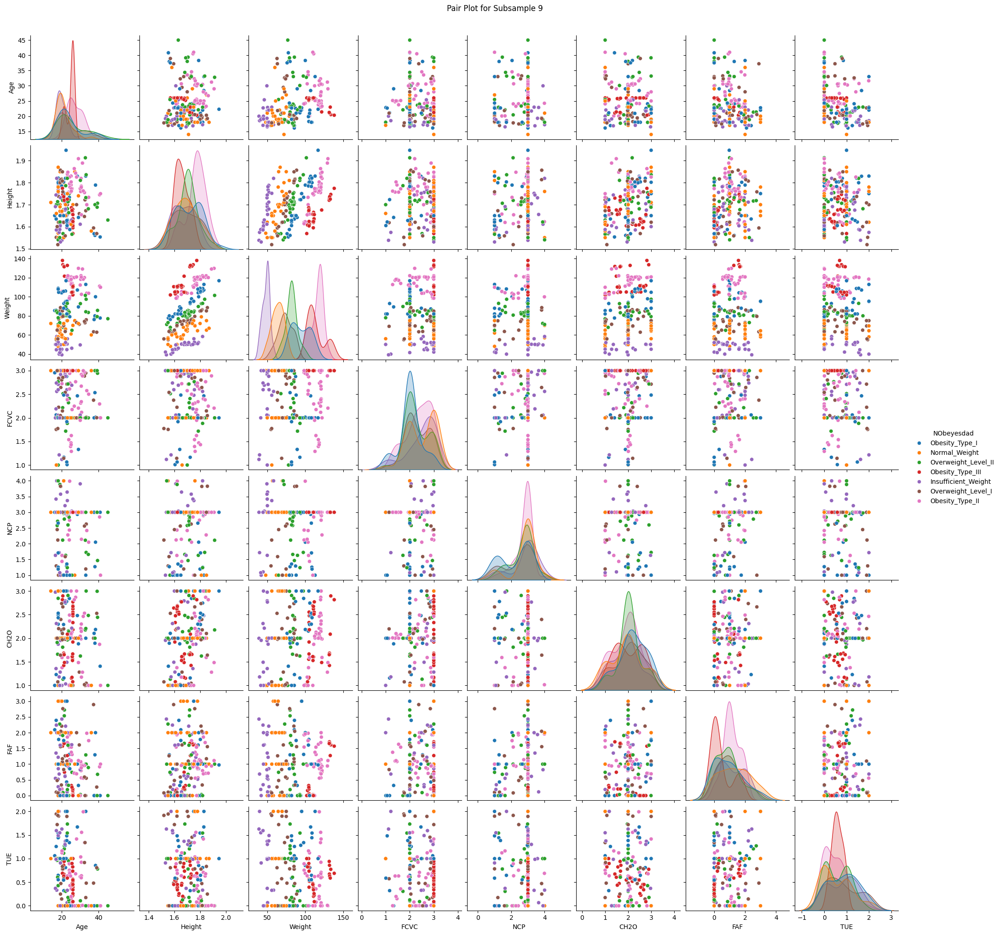

<Figure size 1200x800 with 0 Axes>

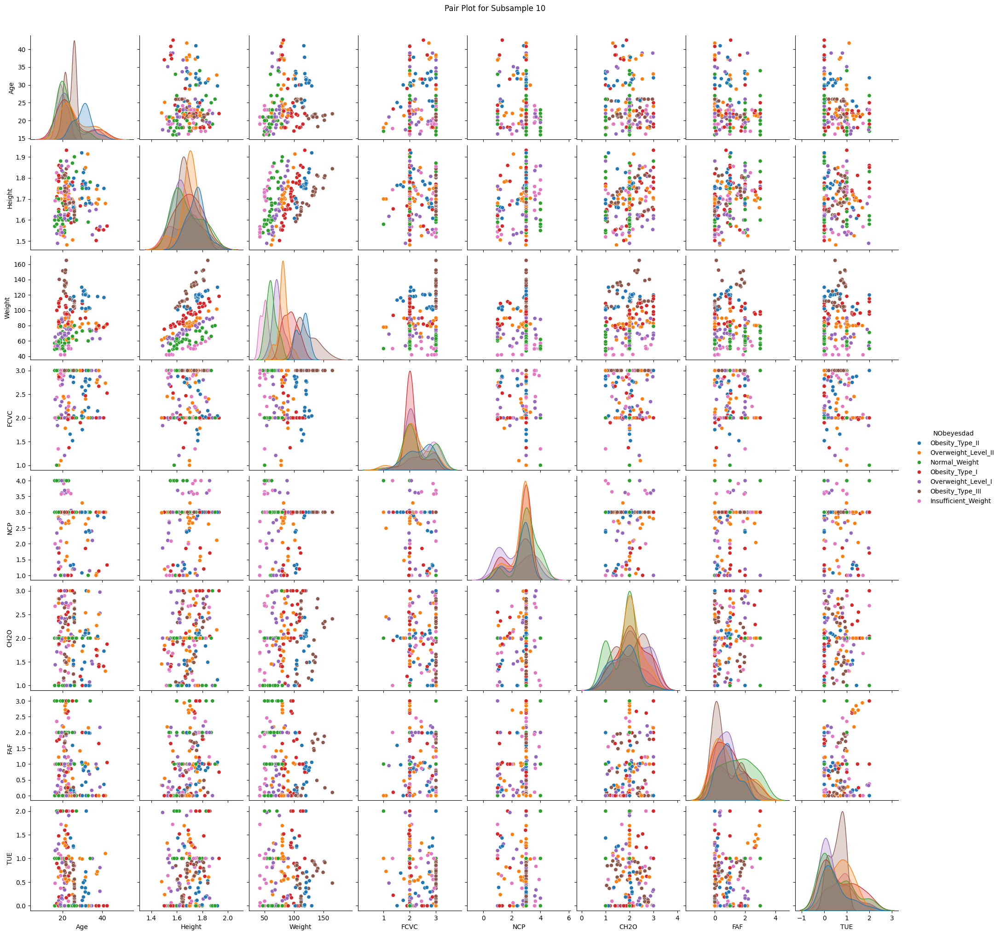

In [4]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from IPython.display import Image, display

file_path = 'ObesityDataSet_raw_and_data_sinthetic.csv'
df = pd.read_csv(file_path)

num_subsamples = 10
subsample_size = int(len(df) * 0.1) 

for i in range(num_subsamples):
    subsample = df.sample(n=subsample_size, random_state=i)
    
    subsample_with_target = pd.concat([subsample.drop(columns=['NObeyesdad']), subsample['NObeyesdad']], axis=1)
    
    # Plot pair plot
    plt.figure(figsize=(12, 8))
    sns.pairplot(subsample_with_target, hue='NObeyesdad', diag_kind='kde')
    plt.suptitle(f'Pair Plot for Subsample {i + 1}', y=1.02)
    plt.show()

**TASK: Create a clustermap with seaborn to explore the relationships between variables.**

<Figure size 1200x1000 with 0 Axes>

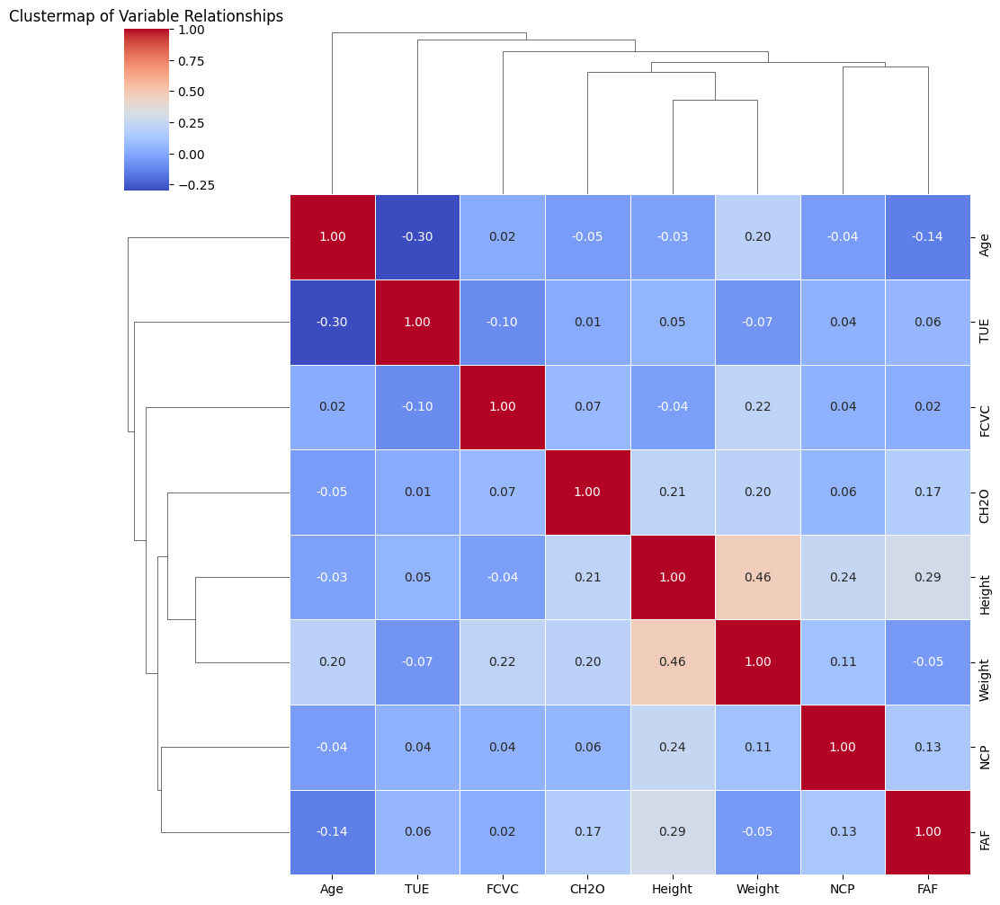

In [5]:
numeric_df = df.select_dtypes(include='number')

correlation_matrix = numeric_df.corr()

plt.figure(figsize=(12, 10))
sns.clustermap(correlation_matrix, cmap='coolwarm', linewidths=0.5, annot=True, fmt=".2f")
plt.title('Clustermap of Variable Relationships')
plt.show()

**TASK: Perform SVM modelling and check the performance of your model, improve the performance of your model using grdisearch**

In [6]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report

X = df.drop(columns=['NObeyesdad'])
y = df['NObeyesdad']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

label_encoder = LabelEncoder()
imputer = SimpleImputer(strategy='mean')

X_train_encoded = X_train.copy()
X_test_encoded = X_test.copy()

for feature in X_train_encoded.select_dtypes(include='object').columns:
    X_train_encoded[feature] = label_encoder.fit_transform(X_train[feature])
    X_test_encoded[feature] = label_encoder.transform(X_test[feature])

X_train_imputed = pd.DataFrame(imputer.fit_transform(X_train_encoded), columns=X_train_encoded.columns)
X_test_imputed = pd.DataFrame(imputer.transform(X_test_encoded), columns=X_test_encoded.columns)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_imputed)
X_test_scaled = scaler.transform(X_test_imputed)

svm = SVC()

param_grid = {
    'C': [0.1, 1, 10, 100],
    'gamma': [1, 0.1, 0.01, 0.001],
    'kernel': ['rbf', 'linear', 'poly']
}

grid_search = GridSearchCV(estimator=svm, param_grid=param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train_scaled, y_train)

best_params = grid_search.best_params_
print("Best Parameters:", best_params)
print("Best Cross-Validation Score:", grid_search.best_score_)

best_svm = SVC(**best_params)
best_svm.fit(X_train_scaled, y_train)

y_pred = best_svm.predict(X_test_scaled)
accuracy = accuracy_score(y_test, y_pred)
print("Model Accuracy:", accuracy)
print(classification_report(y_test, y_pred))

Best Parameters: {'C': 100, 'gamma': 1, 'kernel': 'linear'}
Best Cross-Validation Score: 0.9609028497181887
Model Accuracy: 0.9787234042553191
                     precision    recall  f1-score   support

Insufficient_Weight       0.98      0.96      0.97        56
      Normal_Weight       0.95      0.97      0.96        62
     Obesity_Type_I       0.99      1.00      0.99        78
    Obesity_Type_II       1.00      1.00      1.00        58
   Obesity_Type_III       1.00      1.00      1.00        63
 Overweight_Level_I       0.96      0.95      0.95        56
Overweight_Level_II       0.96      0.96      0.96        50

           accuracy                           0.98       423
          macro avg       0.98      0.98      0.98       423
       weighted avg       0.98      0.98      0.98       423

